In [ ]:
#!pip install --upgrade tensorflow-gpu==2.0

In [ ]:
#!pip install plotly
#!pip install --upgrade nbformat
#!pip install nltk
#!pip install spacy # spaCy is an open-source software library for advanced natural language processing
#!pip install WordCloud
##!pip install gensim 
# Gensim is an open-source library for unsupervised topic modeling and natural language processing
#!pip install seaborn
#!pip install jupyterthemes
import nltk
nltk.download('punkt')

import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
# import keras
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional
from tensorflow.keras.models import Model
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False) 
# setting the style of the notebook t
# setting the style of the notebook to be monokai theme  
# this line of code is important to ensure that we are able to see the x and y axes clearly
# If you don't run this code line, you will notice that the xlabel and ylabel on any plot is black on black and it will be hard to see them. 


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
import os


Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:3 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Ign:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:6 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:8 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:13 http://ppa.launchpad.net/graph

In [ ]:
!wget https://jdbc.postgresql.org/download/postgresql-42.2.9.jar

--2021-06-30 00:32:58--  https://jdbc.postgresql.org/download/postgresql-42.2.9.jar
Resolving jdbc.postgresql.org (jdbc.postgresql.org)... 72.32.157.228, 2001:4800:3e1:1::228
Connecting to jdbc.postgresql.org (jdbc.postgresql.org)|72.32.157.228|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 914037 (893K) [application/java-archive]
Saving to: ‘postgresql-42.2.9.jar.1’

postgresql-42.2.9.j 100%[===================>] 892.61K  --.-KB/s    in 0.09s   

2021-06-30 00:32:58 (10.1 MB/s) - ‘postgresql-42.2.9.jar.1’ saved [914037/914037]



In [ ]:
df_true = pd.read_csv("http://final-project-data-rjj.s3.us-east-2.amazonaws.com/True.csv")
df_true.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [ ]:
df_fake = pd.read_csv("http://final-project-data-rjj.s3.us-east-2.amazonaws.com/Fake.csv")
df_fake.head()


,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
#create new column called 'isfake' in the df_true df
# assign class "1" to df_fake
df_true['isfake'] = 0
df_fake['isfake'] = 1
df_true.head()

,title,text,subject,date,isfake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",0
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",0
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",0
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",0
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",0


In [ ]:
#concatenate real and fake news; reset_index creates one harmonized df with all of the data (index numbers will continue 
#and not be separate as they were with two different dfs); this has 44,000 different samples
df = pd.concat([df_true, df_fake]).reset_index(drop = True)
df

,title,text,subject,date,isfake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",0
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",0
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",0
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",0
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",0
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",1
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",1
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",1
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",1


In [ ]:
# the output class is the isfake; drop date column because do not need
# inplace = True makes the removal of the column permanently, removes it from memory
df.drop(columns = ['date'], inplace = True)
#combine title and text together; new column 'original' created from merging the 'title' and 'text' columns
df['combined'] = df['title'] + ' '+df['text']
df.head()

,title,text,subject,isfake,combined,clean
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,0,"As U.S. budget fight looms, Republicans flip t...","[budget, fight, looms, republicans, flip, fisc..."
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,0,U.S. military to accept transgender recruits o...,"[military, accept, transgender, recruits, mond..."
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,0,Senior U.S. Republican senator: 'Let Mr. Muell...,"[senior, republican, senator, mueller, washing..."
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,0,FBI Russia probe helped by Australian diplomat...,"[russia, probe, helped, australian, diplomat, ..."
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,0,Trump wants Postal Service to charge 'much mor...,"[trump, wants, postal, service, charge, amazon..."


In [ ]:
# this shows the content of the original column, row 0
df['combined'][2]

"Senior U.S. Republican senator: 'Let Mr. Mueller do his job' WASHINGTON (Reuters) - The special counsel investigation of links between Russia and President Trump’s 2016 election campaign should continue without interference in 2018, despite calls from some Trump administration allies and Republican lawmakers to shut it down, a prominent Republican senator said on Sunday. Lindsey Graham, who serves on the Senate armed forces and judiciary committees, said Department of Justice Special Counsel Robert Mueller needs to carry on with his Russia investigation without political interference. “This investigation will go forward. It will be an investigation conducted without political influence,” Graham said on CBS’s Face the Nation news program. “And we all need to let Mr. Mueller do his job. I think he’s the right guy at the right time.”  The question of how Russia may have interfered in the election, and how Trump’s campaign may have had links with or co-ordinated any such effort, has loome

In [ ]:
# PERFORM DATA CLEANING

In [ ]:
# download stop words
# If you see "True" after running, the package has been loaded correctly
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# obtain additional stopwords from nltk
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [ ]:
# to see the entire list of stop words
#stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [ ]:
# create function to remove stopwords and remove words with 2 or less characters
# result = [] used to return the result
# gensim is a powerful library for nlp
# "token" means "word"
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        # for any word to be appended to the results, it has to pass 2 checks - 1) is the word/ token a stopword - if it is not in the stopwords, 
        # we want it so append it/ return it to the results and 2) length of word greater than 2??
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3 and token not in stop_words:
            result.append(token)
            
    return result       
           
            
            

In [ ]:
# apply the function created in the cell above to the df
# this creates a new column "clean" from the "original" column with only tokens that are not stop words and do not have 2 or less characters
df['clean'] = df['combined'].apply(preprocess)

In [ ]:
df.head()
df['clean'].head()

0    [budget, fight, looms, republicans, flip, fisc...
1    [military, accept, transgender, recruits, mond...
2    [senior, republican, senator, mueller, washing...
3    [russia, probe, helped, australian, diplomat, ...
4    [trump, wants, postal, service, charge, amazon...
Name: clean, dtype: object

In [ ]:
# show combined news
df['combined'][0]

'As U.S. budget fight looms, Republicans flip their fiscal script WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non

In [ ]:
# show cleaned up news after removing stopwords; will see that all of the tokens/ words are separated
print(df['clean'][6])

['trump', 'says', 'russia', 'probe', 'fair', 'timeline', 'unclear', 'west', 'palm', 'beach', 'reuters', 'president', 'donald', 'trump', 'said', 'thursday', 'believes', 'fairly', 'treated', 'special', 'counsel', 'investigation', 'russian', 'meddling', 'presidential', 'election', 'said', 'know', 'long', 'probe', 'federal', 'investigation', 'hung', 'trump', 'white', 'house', 'took', 'office', 'year', 'trump', 'allies', 'recent', 'weeks', 'accused', 'team', 'justice', 'department', 'special', 'counsel', 'robert', 'mueller', 'biased', 'republican', 'president', 'interview', 'york', 'times', 'trump', 'appeared', 'shrug', 'concerns', 'investigation', 'prompted', 'intelligence', 'agencies', 'conclusion', 'russia', 'tried', 'help', 'trump', 'defeat', 'democrat', 'hillary', 'clinton', 'hacking', 'releasing', 'embarrassing', 'emails', 'disseminating', 'propaganda', 'collusion', 'think', 'going', 'fair', 'trump', 'said', 'times', 'described', 'minute', 'impromptu', 'interview', 'golf', 'club', 'we

In [ ]:
df

,title,text,subject,isfake,combined,clean
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,0,"As U.S. budget fight looms, Republicans flip t...","[budget, fight, looms, republicans, flip, fisc..."
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,0,U.S. military to accept transgender recruits o...,"[military, accept, transgender, recruits, mond..."
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,0,Senior U.S. Republican senator: 'Let Mr. Muell...,"[senior, republican, senator, mueller, washing..."
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,0,FBI Russia probe helped by Australian diplomat...,"[russia, probe, helped, australian, diplomat, ..."
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,0,Trump wants Postal Service to charge 'much mor...,"[trump, wants, postal, service, charge, amazon..."
...,...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,1,McPain: John McCain Furious That Iran Treated ...,"[mcpain, john, mccain, furious, iran, treated,..."
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,1,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,"[justice, yahoo, settles, mail, privacy, class..."
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,1,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,"[sunnistan, allied, safe, zone, plan, territor..."
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,1,How to Blow $700 Million: Al Jazeera America F...,"[blow, million, jazeera, america, finally, cal..."


In [ ]:
# obtain the total number of words now present in the dataset
list_of_words = []
for i in df.clean:
    for j in i:
        list_of_words.append(j)

In [ ]:
list_of_words

['budget',
 'fight',
 'looms',
 'republicans',
 'flip',
 'fiscal',
 'script',
 'washington',
 'reuters',
 'head',
 'conservative',
 'republican',
 'faction',
 'congress',
 'voted',
 'month',
 'huge',
 'expansion',
 'national',
 'debt',
 'cuts',
 'called',
 'fiscal',
 'conservative',
 'sunday',
 'urged',
 'budget',
 'restraint',
 'keeping',
 'sharp',
 'pivot',
 'republicans',
 'representative',
 'mark',
 'meadows',
 'speaking',
 'face',
 'nation',
 'drew',
 'hard',
 'line',
 'federal',
 'spending',
 'lawmakers',
 'bracing',
 'battle',
 'january',
 'return',
 'holidays',
 'wednesday',
 'lawmakers',
 'begin',
 'trying',
 'pass',
 'federal',
 'budget',
 'fight',
 'likely',
 'linked',
 'issues',
 'immigration',
 'policy',
 'november',
 'congressional',
 'election',
 'campaigns',
 'approach',
 'republicans',
 'seek',
 'control',
 'congress',
 'president',
 'donald',
 'trump',
 'republicans',
 'want',
 'budget',
 'increase',
 'military',
 'spending',
 'democrats',
 'want',
 'proportional',
 '

In [ ]:
# output shows that there are 9,277,072 samples in the list_of_words
len(list_of_words)

9277072

In [ ]:
# obtain the total number of unique words; using "set" returns back only the unique words; output of this shows there are 108,648 unique words
total_words = len(list(set(list_of_words)))
total_words

108705

In [ ]:
# join the words into one massive string that contains all of the words (so they are no longer separated)
# code below joins all of the words that are separated by a space ( " ") and creates new df column called 'clean_joined'
df['clean_joined'] = df['clean'].apply(lambda x: " ".join(x))

In [ ]:
print(df['clean'][2])

['senior', 'republican', 'senator', 'mueller', 'washington', 'reuters', 'special', 'counsel', 'investigation', 'links', 'russia', 'president', 'trump', 'election', 'campaign', 'continue', 'interference', 'despite', 'calls', 'trump', 'administration', 'allies', 'republican', 'lawmakers', 'shut', 'prominent', 'republican', 'senator', 'said', 'sunday', 'lindsey', 'graham', 'serves', 'senate', 'armed', 'forces', 'judiciary', 'committees', 'said', 'department', 'justice', 'special', 'counsel', 'robert', 'mueller', 'needs', 'carry', 'russia', 'investigation', 'political', 'interference', 'investigation', 'forward', 'investigation', 'conducted', 'political', 'influence', 'graham', 'said', 'face', 'nation', 'news', 'program', 'need', 'mueller', 'think', 'right', 'right', 'time', 'question', 'russia', 'interfered', 'election', 'trump', 'campaign', 'links', 'ordinated', 'effort', 'loomed', 'white', 'house', 'trump', 'took', 'office', 'january', 'shows', 'sign', 'receding', 'trump', 'prepares', '

In [ ]:
#can view samples as a way of performing a 'sanity check'
df['clean_joined'][2]

'senior republican senator mueller washington reuters special counsel investigation links russia president trump election campaign continue interference despite calls trump administration allies republican lawmakers shut prominent republican senator said sunday lindsey graham serves senate armed forces judiciary committees said department justice special counsel robert mueller needs carry russia investigation political interference investigation forward investigation conducted political influence graham said face nation news program need mueller think right right time question russia interfered election trump campaign links ordinated effort loomed white house trump took office january shows sign receding trump prepares second year power despite intensified rhetoric trump allies recent weeks accusing mueller team bias republican president trump undercut supporters interview week york times said expected mueller going fair russia role election question possible links trump campaign focus

In [ ]:
# VISUALIZE CLEANED UP DATASET

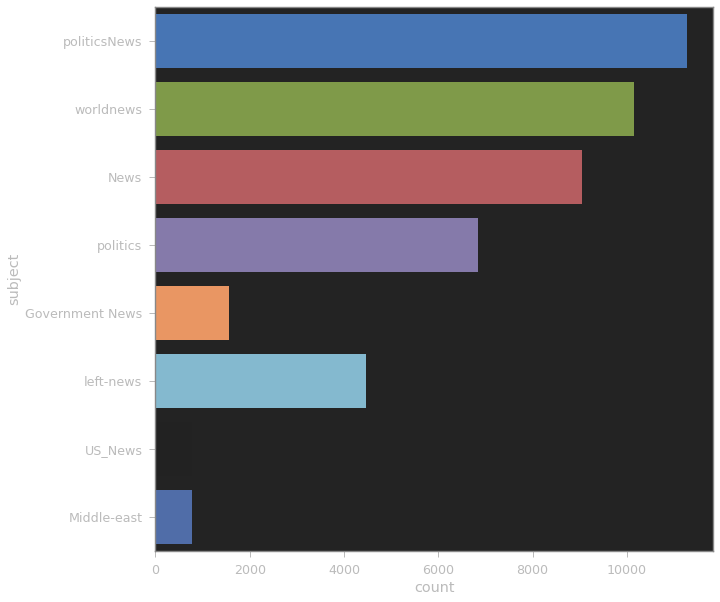

In [ ]:
# plot the number of samples in 'subject'
# sns.countplot asks to count the number of different "subjects" in the "subject" column
# data = df says that the source of the data is "df" (my dataframe)
plt.figure(figsize = (10, 10))
sns.countplot(y = "subject", data = df)


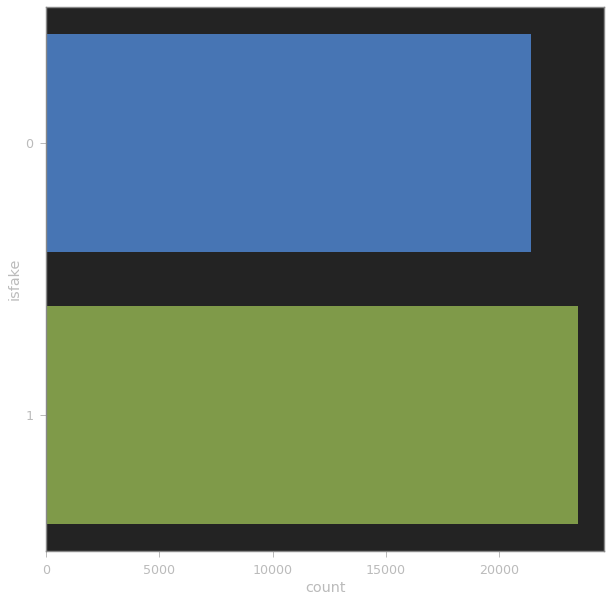

In [ ]:
plt.figure(figsize = (10, 10))
sns.countplot(y = "isfake", data = df)


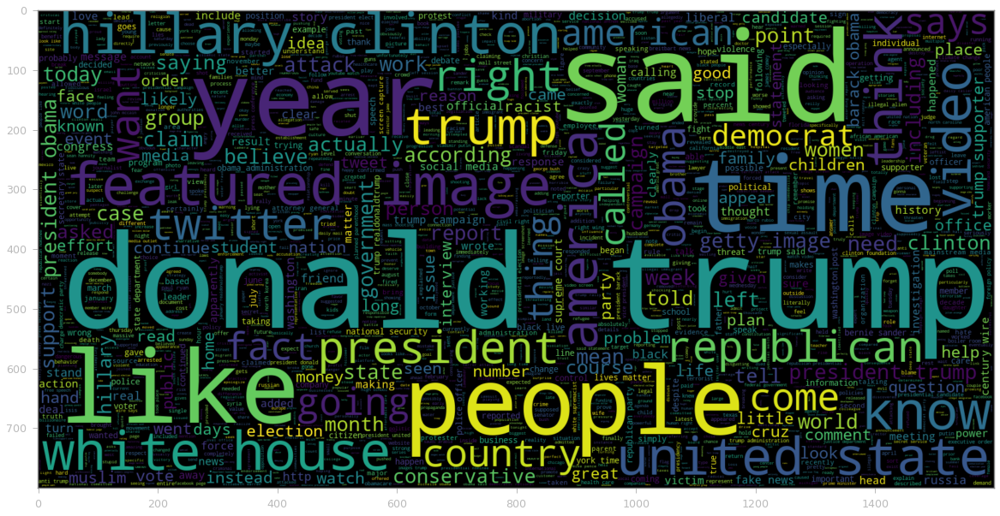

In [ ]:
# plot the word cloud for text that is real to see importance of each of the words
# used from:     from wordcloud import WordCloud, STOPWORDS
plt.figure(figsize = (20, 20))
#code below is printing out the most common words when the news is fake ( "df.isfake == 1")
wc = WordCloud(max_words = 2000, width = 1600, height = 800, stopwords = stop_words).generate(" ".join(df[df.isfake == 1].clean_joined))
plt.imshow(wc, interpolation = "bilinear")

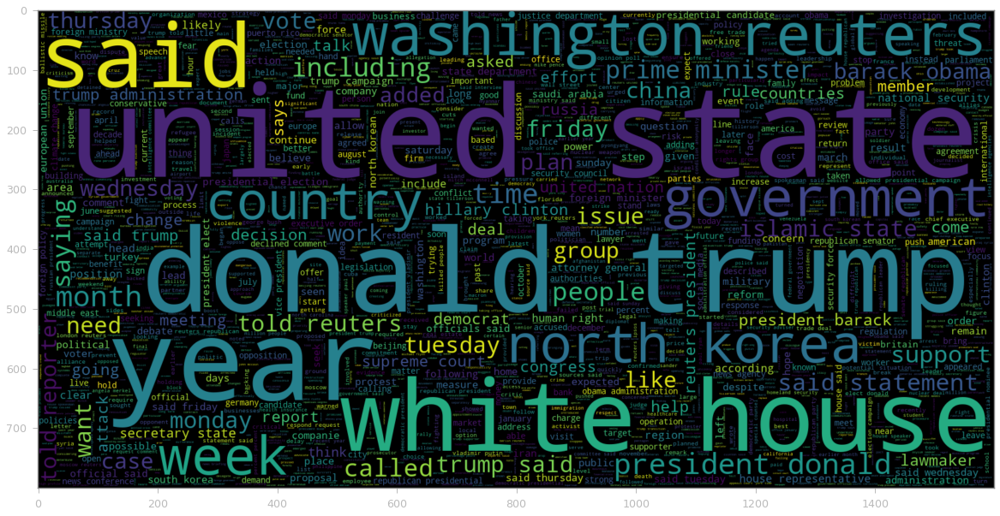

In [ ]:
plt.figure(figsize = (20, 20))
#code below is printing out the most common words when the news is real( "df.isfake == 0")
wc = WordCloud(max_words = 2000, width = 1600, height = 800, stopwords = stop_words).generate(" ".join(df[df.isfake == 0].clean_joined))
plt.imshow(wc, interpolation = "bilinear")

In [ ]:
nltk.word_tokenize(df['clean_joined'][0])

['budget',
 'fight',
 'looms',
 'republicans',
 'flip',
 'fiscal',
 'script',
 'washington',
 'reuters',
 'head',
 'conservative',
 'republican',
 'faction',
 'congress',
 'voted',
 'month',
 'huge',
 'expansion',
 'national',
 'debt',
 'cuts',
 'called',
 'fiscal',
 'conservative',
 'sunday',
 'urged',
 'budget',
 'restraint',
 'keeping',
 'sharp',
 'pivot',
 'republicans',
 'representative',
 'mark',
 'meadows',
 'speaking',
 'face',
 'nation',
 'drew',
 'hard',
 'line',
 'federal',
 'spending',
 'lawmakers',
 'bracing',
 'battle',
 'january',
 'return',
 'holidays',
 'wednesday',
 'lawmakers',
 'begin',
 'trying',
 'pass',
 'federal',
 'budget',
 'fight',
 'likely',
 'linked',
 'issues',
 'immigration',
 'policy',
 'november',
 'congressional',
 'election',
 'campaigns',
 'approach',
 'republicans',
 'seek',
 'control',
 'congress',
 'president',
 'donald',
 'trump',
 'republicans',
 'want',
 'budget',
 'increase',
 'military',
 'spending',
 'democrats',
 'want',
 'proportional',
 '

In [ ]:
# length of maximum document (News)  will be needed to create word embeddings
# need to go through every sample in the dataframe to obtain maximum amount(?)/ length of words in any news sample
# clean_joined is name of column we created
# maxlen is variable, have set it to -1 initially
maxlen = -1
for doc in df.clean_joined:
    # use nltk.word_tokenize(doc)  to divide each of the complete sentences into tokens
    tokens = nltk.word_tokenize(doc)
    # if after going through the samples, the length of tokens is more than the maxlen, then that will be the new maxlen
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("The maximum number of words in any document is =", maxlen)

In [ ]:
#visualize the distribution of number of words in a text
import plotly.express as px
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df.clean_joined], nbins = 100)
fig.show()

In [ ]:
# PREPARE DATA BY PERFORMING TOKENIZATION AND PADDING
# tokenizer allows us to vectorize text by turning each text into a sequence of integers
# a token is an integer representing a text/ word (?)

In [ ]:
# split data into test and train
from sklearn.model_selection import train_test_split
# in code below, "df.clean_joined" is x (the input) and "df.isfake" is y (the target)
# test_size = 0.2 indicates that 20% of the data will be used for testing - and so 80% will be allocated for training
x_train, x_test, y_train, y_test = train_test_split(df.clean_joined, df.isfake, test_size = 0.2)

In [ ]:
from nltk import word_tokenize

In [ ]:
# Create a tokenizer to tokenize the words and create sequences of tokenized words
#use fit_on_texts on the x_train and will feed it back to the tokenizer
# fit_on_texts creates a vocabulary index based on word frequency, every word gets a unique integer value

tokenizer = Tokenizer(num_words = total_words)
tokenizer.fit_on_texts(x_train)
# use tokenizer to convert from text data to integers; the lines below do the actual conversion from text to integers
train_sequences = tokenizer.texts_to_sequences(x_train)
test_sequences = tokenizer.texts_to_sequences(x_test)

In [ ]:
len(train_sequences)

35935

In [ ]:
train_sequences

[[3491,
  14959,
  583,
  13942,
  7474,
  1332,
  27,
  48,
  7474,
  641,
  65100,
  2797,
  5,
  25132,
  1332,
  951,
  6050,
  1278,
  8774,
  2992,
  26,
  246,
  2345,
  3681,
  255,
  906,
  4088,
  4,
  354,
  4,
  854,
  3681,
  654,
  2908,
  212,
  353,
  2144,
  771,
  5172,
  13042,
  750,
  12174,
  12175,
  3491,
  5477,
  7474,
  951,
  6050,
  27,
  622,
  811,
  1451,
  484,
  1485,
  65101,
  65102,
  65103,
  49575,
  12175,
  21820,
  3681,
  26,
  342,
  2181,
  3681,
  2654,
  334,
  5841,
  3008,
  1638,
  3681,
  2654,
  586,
  306,
  4,
  14,
  2181,
  2654,
  3681,
  1332,
  2431,
  5954,
  2992,
  264,
  56,
  909,
  246,
  44,
  760,
  352,
  122,
  1332,
  350,
  19123,
  6375,
  258,
  9945,
  2601,
  6324,
  4858,
  3218,
  3681,
  110,
  2373,
  143,
  777,
  915,
  176,
  11,
  58,
  2,
  141,
  1628,
  732,
  3681,
  654,
  15463,
  1058,
  352,
  122,
  923,
  3218,
  1467,
  732,
  9722,
  654,
  502,
  630,
  5499,
  160,
  64,
  4,
  1332,
  460,

In [ ]:
len(test_sequences)

8984

In [ ]:
print("The encoding for document\n", df.clean_joined[0], "\n is: ", train_sequences[0])

The encoding for document
 budget fight looms republicans flip fiscal script washington reuters head conservative republican faction congress voted month huge expansion national debt cuts called fiscal conservative sunday urged budget restraint keeping sharp pivot republicans representative mark meadows speaking face nation drew hard line federal spending lawmakers bracing battle january return holidays wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy november congressional election campaigns approach republicans seek control congress president donald trump republicans want budget increase military spending democrats want proportional increases defense discretionary spending programs support education scientific research infrastructure public health environmental protection trump administration willing going increase defense discretionary spending percent meadows chairman small influential house freedom caucus said program democrats say

In [ ]:
# add padding to make sure that all samples are the exact same length using pad_sequences
#either be maxlen = 4405 or smaller number maxlen = 40 seems to work well based on results
# the number 4405 comes from the max # of words calculated earlier??
padded_train = pad_sequences(train_sequences, maxlen = 4405, padding = 'post', truncating ='post')
padded_test = pad_sequences(test_sequences, maxlen = 4405, truncating ='post')

In [ ]:
for i, doc in enumerate(padded_train[:2]):
    print("the padded encoding for document", i+1," is : ",doc)

the padded encoding for document 1  is :  [ 3491 14959   583 ...     0     0     0]
the padded encoding for document 2  is :  [2798  839 3088 ...    0    0    0]


In [ ]:
# BUILD AND TRAIN MODEL  USING KERAS AND TENSORFLOW

In [ ]:
# sequential model
model = Sequential()

In [ ]:
# embedding layer; we got total_words variable earlier in this code
model.add(Embedding(total_words, output_dim = 128))
# model.add(Embedding(total_words, output_dim = 240))

InternalError: cudaGetDevice() failed. Status: cudaGetErrorString symbol not found.

In [ ]:
# Bi-directional RNN/LSTM
model.add(Bidirectional(LSTM(128)))


In [ ]:
# Dense layers; 128 is the # of layers;  'acc' is 'accuracy'
model.add(Dense(128, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
model.summary()

ValueError: This model has not yet been built. Build the model first by calling `build()` or calling `fit()` with some data, or specify an `input_shape` argument in the first layer(s) for automatic build.

In [ ]:
total_words

In [ ]:
# convert y_train to an array
y_train = np.asarray(y_train)

In [ ]:
# train the model
# input is "padded_train", output is "y_train"
# validation_split = 0.1 because we are going to use 10% of the data for validation and 90% for training
model.fit(padded_train, y_train, batch_size = 64, validation_split = 0.1, epochs = 2)

ValueError: Input 0 of layer sequential is incompatible with the layer: expected ndim=3, found ndim=2. Full shape received: [None, 4405]

In [ ]:
# as model is being trained, after every epoch, we want to see if the error on the validation data is decreasing or not
# if the error on the training data and the validation data is going down also, that is good - means the model is able to generalize
# if the error on the training data is going down but error on validation data is going up, that is a problem


In [ ]:
# ASSESS TRAINED MODEL PERFORMANCE

In [ ]:
# make prediction by applying the predict method on the model & feed in the test data instead of the training data
pred = model.predict(padded_test)

InternalError: cudaGetDevice() failed. Status: cudaGetErrorString symbol not found.

In [ ]:
# if the predicted value is > 0.5, it is real, else it is fake
prediction = []
for i in range(len(pred)):
    if pred[i].item() > 0.5:
        prediction.append(1)
    else:
        prediction.append(0)

NameError: name 'pred' is not defined

In [ ]:
# getting the accuracy
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(list(y_test), prediction)

print("Model Accuracy : ", accuracy)

In [ ]:
# then print out the confusion matrix to visualize the model's predictions vs. the actual "ground truth"
from sklearn.metrics import confusion_matrix
cm = confusion.matrix(list(y_test, prediction)
plt.figure(figsize = (25, 25))
sns.heatmap(cm, annot = True)
                   